# Multivariate regression for attention: exploring attrition

In this notebook, we shall conduct regression analysis to look at the effect of different variables on the attrition. But our main goal is to understand attention and to explore attention threshold. 

Note: This is after rematching i.e. when we decided to re-run the entire analysis properly defining the filtered sample. 

**Outcome Variable:**

Attrition rate

**Independent Variables:**

1. Gender
2. Scientist’s (binned) academic age at the time of retraction
3. Number of (binned) citations prior to retraction
4. Number of (binned) collaborators prior to retraction
5. Number of (binned) papers published up to retraction
6. (Aggregated) Field
7. Author contribution rank in the paper i.e. first or last or middle
8. Retraction year
9. Retraction reason
10. Retracted paper published in journal or conference
11. Journal impact factor (or rank)
12. Affiliation rank at the time of retraction
13. Number of authors in the retracted paper
14. **Attention given to the paper i.e. number of mentions within the 12 month retraction window. This will be computed and added in multiple mutually exclusive ways:**
    1. **(Tertiarized/Binarized) Altmetric score**
    2. **(Tertiarized/Binarized) mentions from four types of sources all entered separately into the regression model.**
    3. **Optionally (Tertiarized/Binarized) mentions from 14 different sources all entered separately into the regression model.**

In [75]:
# Importing relevant libraries

import pandas as pd
from sklearn import datasets
import statsmodels.api as sm
import statsmodels.formula.api as smf
from stargazer.stargazer import Stargazer
import math
import numpy as np

In [76]:
# Reading the regression file

#df_main = pd.read_csv("../../../../data/h4_altmetric/regression/RW_Authors_forRegression_rematching.csv")
#df_main = pd.read_csv("test.csv")
df_main = pd.read_csv("/Users/sm9654/desktop/NYUAD/nyuad-research/retraction_effects_on_collaboration_networks/data/h4_altmetric/regression/RW_Authors_forRegression_rematching.csv")
#df_main = df_main[df_main['nRetracted'] == 1]
# Let us define the dependent variable

Yi = 'AttritedClass'
Yroot = 'attritionClusteredLinearwSJR'

df_main.MAGAID.nunique()

15614

In [77]:
# Removing class that's neither attrited nor non-attrited (i.e. those that are attrited due to something else)
df_main = df_main[df_main.AttritedClass.isin([0,1])]

df_main.MAGAID.nunique()

14583

In [78]:
# Checking how many attrited and how many not attrited
df_main[['MAGAID','AttritedClass']].drop_duplicates().AttritedClass.value_counts()

AttritedClass
0    11347
1     3236
Name: count, dtype: int64

In [65]:

rank_dict = {'101-150':125,
             '151-200':175,
             '201-300':250,
             '301-400':350,
             '401-500':450,
             '501-600':550,
             '601-700':650,
             '701-800':750,
             '801-900':850,
             '901-1000':950,
             '1001-':1500}

def map2numeric_aff_rank(row):
    return rank_dict.get(row['MAGRetractionYearAffRank'],
                        row['MAGRetractionYearAffRank'])
    

df_main['MAGRetractionYearAffRankOrdinal'] = \
                df_main\
                    .apply(lambda row: map2numeric_aff_rank(row), axis=1)

df_main['MAGRetractionYearAffRankOrdinal'] = \
    df_main['MAGRetractionYearAffRankOrdinal'].astype(float)


# Now we create logged categories with laplace smoothing
df_main['LogMAGCumCitationsAtRetraction'] = \
        np.log(df_main['MAGCumCitationsAtRetraction']+1)

df_main['LogMAGCumCollaboratorsAtRetraction'] = \
        np.log(df_main['MAGCumCollaboratorsAtRetraction']+1)


# # Extracting dummy variables for fields

# df_dummies_nHot = pd.crosstab(df_main['MAGAID'],df_main['MAGFieldName']).astype(bool).\
#                     replace({False:0,True:1}).add_prefix('Field_').reset_index()

# df_main = df_main.merge(df_dummies_nHot, on='MAGAID', how='left')

# # Find columns with the suffix "Field_"
# field_columns = [col for col in df_main.columns if col.startswith('Field_')]

# Replace spaces with underscores only for those columns
# for col in field_columns:
#     df_main.rename(columns={col: col.replace(' ', '_')}, inplace=True)

df_main.head()
df_main.columns.tolist()

['Record ID',
 'MAGPID',
 'RetractionYear',
 'OriginalPaperYear',
 'MAGAffIDRetractedPaper',
 'MAGRetractedPIDYear',
 'MAGAffRankRetractedPaper',
 'MAGFirstName',
 'GenderizeGender',
 'GenderizeConfidence',
 'FinalGender',
 'MAGFirstPubYear',
 'MAGCumPapersYearAtRetractionMinus1',
 'MAGCumPapersAtRetractionMinus1',
 'MAGCumCitationsYearAtRetractionMinus1',
 'MAGCumCitationsAtRetractionMinus1',
 'MAGCumCollaboratorsYearAtRetractionMinus1',
 'MAGCumCollaboratorsAtRetractionMinus1',
 'MAGFirstAffID',
 'MAGFirstYear',
 'MAGFirstAffiliationRank',
 'MAGAIDRankInRetractedPaper',
 'NumAuthorsInRetractedPaper',
 'MAGFirstAuthorFlag',
 'MAGLastAuthorFlag',
 'MAGRetractionYearAffID',
 'MAGRetractionYearAffYear',
 'MAGRetractionYearAffRank',
 'MAGAID',
 'MAGFieldID',
 'MAGFieldIDMaxPercent',
 'MAGFieldName',
 'Field_ART',
 'Field_BIOLOGY',
 'Field_BUSINESS',
 'Field_CHEMISTRY',
 'Field_COMPUTERSCIENCE',
 'Field_ECONOMICS',
 'Field_ENGINEERING',
 'Field_ENVIRONMENTALSCIENCE',
 'Field_GEOGRAPHY',
 '

In [79]:
# Defining attention columns

attention_agg_cols = ['AltmetricScoreAtRetraction',
                     'AggregateSocialMediaMentionsAtRetraction',
                     'AggregateNewsMediaMentionsAtRetraction',
                     'AggregateBlogsMentionsAtRetraction',
                     'AggregateKnowledgeRepositoriesMentionsAtRetraction']

# Creating the relevant dataframe
df = df_main[['Record ID','MAGAID'] + [Yi,'AttritedClassRobust']+
                 ['GenderizeGender',
                 'AcademicAgeAtRetraction',
                 'MAGCumPapersAtRetraction',
                 'LogMAGCumCitationsAtRetraction',
                 'LogMAGCumCollaboratorsAtRetraction']+
                list(df_main.\
                    filter(regex=("Field_.*")).columns)+
                ['MAGAIDRankTypeInRetractedPaper',
                'RetractionYear',
                'ReasonPropagatedMajorityOfMajority',
                'MAGJournalType',
                'SJRQuartileRetractedPaperYear',
                'MAGRetractionYearAffRankOrdinal',
                'NumAuthorsInRetractedPaper']+
                attention_agg_cols].drop_duplicates()




In [80]:
df.GenderizeGender.value_counts()

GenderizeGender
male      10743
female     3840
Name: count, dtype: int64

In [81]:
df['ReasonPropagatedMajorityOfMajority'].value_counts()

ReasonPropagatedMajorityOfMajority
plagiarism    4208
mistake       4149
misconduct    3264
other         2962
Name: count, dtype: int64

## Running Multivariate Regressions

In [82]:
def regress(df, equation):
    df = df.dropna()
    return smf.ols(Yi + "~ "+equation, data=df, missing='drop').fit(cov_type='cluster',
                                                                      cov_kwds={'groups':df['Record ID']})


In [83]:
# Defining dictionary that goes from field id to expression

expression_dict = {
        "age": "AcademicAgeAtRetraction",
        "gender": "C(GenderizeGender, Treatment(reference='male'))",
        "yearofretraction": "RetractionYear",
        "logcitations":"LogMAGCumCitationsAtRetraction",
        "logcollaborators":"LogMAGCumCollaboratorsAtRetraction",
        "papers":"MAGCumPapersAtRetraction",
        "reasons":"C(ReasonPropagatedMajorityOfMajority, Treatment(reference='mistake'))",
        "affrank":"MAGRetractionYearAffRankOrdinal",
        "contributionrank":"C(MAGAIDRankTypeInRetractedPaper, Treatment(reference='First or Last or Only Author'))",
        "numauthors":"NumAuthorsInRetractedPaper",
        "venue":"C(MAGJournalType, Treatment(reference='conference'))",
        "impactfactor":"SJRQuartileRetractedPaperYear",
        "field": " + ".join(list(df_main.filter(regex=("Field_.*")).columns))
}


fieldid_to_fieldname = {
        "age": ["AcademicAgeAtRetraction"],
        "gender": ["GenderizeGender"],
        "yearofretraction": ["RetractionYear"],
        "logcitations":["LogMAGCumCitationsAtRetraction"],
        "logcollaborators":["LogMAGCumCollaboratorsAtRetraction"],
        "papers":["MAGCumPapersAtRetraction"],
        "reasons":["ReasonPropagatedMajorityOfMajority"],
        "affrank":["MAGRetractionYearAffRankOrdinal"],
        "contributionrank":["MAGAIDRankTypeInRetractedPaper"],
        "numauthors":["NumAuthorsInRetractedPaper"],
        "venue":["MAGJournalType"],
        "impactfactor":["SJRQuartileRetractedPaperYear"],
        "field": list(df_main.filter(regex=("Field_.*")).columns)
}

In [84]:
# Academic Age
def age():
    global equation, ests, data
    field_id = "age"
    equation = equation + " + " + expression_dict.get(field_id)
    est = regress(data, equation)
    ests.append(est)

# Year of retraction
def yearofretraction():
    global equation, ests, data
    field_id = "yearofretraction"
    equation = equation + " + " + expression_dict.get(field_id)
    est = regress(data, equation)
    ests.append(est)

# Number of citations
def logcitations():
    global equation, ests, data
    field_id = "logcitations"
    equation = equation + " + " + expression_dict.get(field_id)
    est = regress(data, equation)
    ests.append(est)

# Number of collaborators
def logcollaborators():
    global equation, ests, data
    field_id = "logcollaborators"
    equation = equation + " + " + expression_dict.get(field_id)
    est = regress(data, equation)
    ests.append(est)

# Number of papers
def papers():
    global equation, ests, data
    field_id = "papers"
    equation = equation + " + " + expression_dict.get(field_id)
    est = regress(data, equation)
    ests.append(est)

# Gender
def gender():
    global equation, ests, data
    field_id = "gender"
    equation = equation + " + " + expression_dict.get(field_id)
    # Cleaning gender
    data = data[data.GenderizeGender.isin(['male','female'])]
    est = regress(data, equation)
    ests.append(est)

# Reason of retraction
def reasons():
    global equation, ests, data
    field_id = "reasons"
    equation = equation + " + " + expression_dict.get(field_id)
    # Cleaning reasons
    #data = data[data.ReasonPropagatedMajorityOfMajority.isin(['M','P','H'])]
    est = regress(data, equation)
    ests.append(est)

# Author affiliation rank 
def affrank():
    global equation, ests, data
    field_id = "affrank"
    equation = equation + " + " + expression_dict.get(field_id)
    est = regress(data, equation)
    ests.append(est)

# Author contribution rank
def contributionrank():
    global equation, ests, data
    field_id = "contributionrank"
    equation = equation + " + " + expression_dict.get(field_id)
    est = regress(data, equation)
    ests.append(est)

# Number of authors in the paper
def numauthors():
    global equation, ests, data
    field_id = "numauthors"
    equation = equation + " + " + expression_dict.get(field_id)
    est = regress(data, equation)
    ests.append(est)

# Journal or conference
def venue():
    global equation, ests, data
    field_id = "venue"
    equation = equation + " + " + expression_dict.get(field_id)
    est = regress(data, equation)
    ests.append(est)

# Field
def field():
    global equation, ests, data
    field_id = "field"
    equation = equation + " + " + expression_dict.get(field_id)
    est = regress(data, equation)
    ests.append(est)
    
def regress_one_by_one(attention_expression, funcs):
    """
    In this function, we shall look at the effect of 
    attention on attrition while controlling for other 
    variables. We shall, however, add the controls one by one.
    """
    global equation, ests, data
    
    # We will save out estimators in a list
    ests = []
    
    # Initializing data
    data = df.copy()
    
    # Attention is our key variable, so we fix that
    
    equation = attention_expression
    
    est = regress(data, equation)
    
    ests.append(est)
    
    for func in funcs:
        func()
    
    return ests

def regress_all_together(dfi, attention_field, attention_expression, field_ids):
    """
    In this function, we shall run one regression with all the 
    controls given as func_ids
    """
    
    # Initializing the equation
    equation = attention_expression
    
    for field_id in field_ids:
        equation = equation + " + " + expression_dict.get(field_id)
        
    data = dfi.copy()
    
    # Fields to keep
    fields_to_keep = []
    for fid in field_ids:
        fields_to_keep += fieldid_to_fieldname.get(fid)
    
    print("Fields we keep for this regresion",fields_to_keep)
    
    data = data[['MAGAID','Record ID', attention_field, Yi]+fields_to_keep].drop_duplicates()
    
    # Cleaning if needed
#     if "gender" in field_ids:
#         # Cleaning gender
#         data = data[data.GenderizeGender.isin(['male','female'])]

#     if "reasons" in field_ids:
#         data = data[data.ReasonPropagatedMajorityOfMajority.isin(['M','P','H'])]
        
    est = regress(data, equation)
    
    return est

### Regression with discretized scores

In [85]:
def discretize_attention_binary(score, threshold_high=5):
    if score < threshold_high:
        return "low attention"
    elif score >= threshold_high:
        return "high attention"
        
def discretize_attention_tertiary(score, threshold_medium=3, threshold_high=5):
    assert(threshold_medium < threshold_high)
    if score < threshold_medium:
        return "low attention"
    elif score >= threshold_medium and score < threshold_high:
        return "medium attention"
    elif score >= threshold_high:
        return "high attention"

#### Defining default and alternating fields

In [86]:
default_fids = ["yearofretraction", "gender", "contributionrank", "venue", "impactfactor",
             "reasons", "field", "affrank", "numauthors",]

alternating_fids = ["age", "papers", "logcitations", "logcollaborators"]

funcOrder = [age, yearofretraction, gender, contributionrank, venue, 
             reasons, field, logcitations, logcollaborators, papers, 
             affrank, numauthors,]

### Finding optimal threshold for discretizing attention

#### Understanding numerical bounds

Let us first see the limit i.e. upper bound we need to explore for each type of mention.

In [87]:
# Upper bound for Altmetric Score 
ub_altmetric = int(df['AltmetricScoreAtRetraction'].quantile(.99))
ub_altmetric

64

<AxesSubplot:>

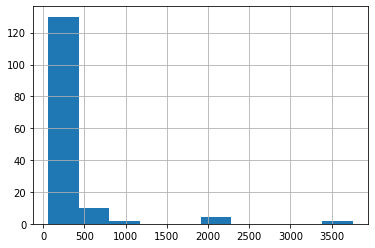

In [88]:
df[df['AltmetricScoreAtRetraction'].gt(ub_altmetric)].AltmetricScoreAtRetraction.hist()

In [52]:
df[df['AltmetricScoreAtRetraction'].gt(ub_altmetric)].AltmetricScoreAtRetraction.\
    value_counts().reset_index().sort_values(by='AltmetricScoreAtRetraction')


,AltmetricScoreAtRetraction,count
4,70.50,13
3,73.00,15
22,73.75,2
6,81.00,10
0,86.00,18
31,88.75,1
19,92.25,3
18,93.25,3
17,96.75,3
7,97.00,9


In [53]:
def explore_thresholds_binary_helper(dfi, experience_fields, attention_field, ub):
    
    print("Exploring following experience fields:", experience_fields)
        
    # This is the dictionary we shall add return threshold --> [coeff, pvalue]

    threshold_to_coefs = {}
    regressors = []
    
    # Going through each threshold
    for threshold_high in range(1,ub+1):
        
        print("Threshold high:",threshold_high)
        
        # Discretizing the current attention field into binary based on the current threshold
        dfi['Binary'+attention_field] = dfi.apply(lambda row: \
                                        discretize_attention_binary(row[attention_field],threshold_high),
                                        axis=1)
        
        # Describing the attention expression
        attention_exp = "C(Binary"+attention_field+", Treatment('low attention'))"
        
        # Finally regressing
        est = regress_all_together(dfi, 'Binary'+attention_field, attention_exp, default_fids + experience_fields)
        
        # Saving the regression coefficients for attention 
        threshold_to_coefs[threshold_high] = [est.params[attention_exp+'[T.high attention]'],
                                              est.pvalues[attention_exp+'[T.high attention]']]
        
        # Saving the regressor
        regressors.append(est)
        
    return threshold_to_coefs, regressors

In [54]:
def explore_thresholds_binary(attention_field, ub):
    
    # We will run this function for all the different kinds of experience fields together and one by one
    
    # Copying the df locally
    dfi = df.copy()
    
    # The dictionary we shall populate for each variant of model
    exp_field_to_threshold_dicts = {}
    
    # Going through each experience field
    for alt_fid in alternating_fids:
        
        experience_fields = [alt_fid]
        
        threshold_to_coefs, regressors = explore_thresholds_binary_helper(dfi, experience_fields, attention_field, ub)
        
        exp_field_to_threshold_dicts[alt_fid] = threshold_to_coefs
        
    return exp_field_to_threshold_dicts, regressors

In [25]:
def explore_threshold_tertiary_helper(dfi, experience_fields, attention_field, ub,
                                     reference_category="medium attention"):
    
    print("Exploring field:", experience_fields)
    
    threshold_to_coefs = {}
    
    ests = []
    
    middle_high = [(a, b) for a in range(1,ub) for b in range(ub) if a < b]
    
    # Going through each pair of middle and high attention threshold
    for medium,high in middle_high:
        
        print("Threshold medium:",medium,", high:",high)
        
        # Discretizing attention
        dfi['Tertiary'+attention_field] = dfi.apply(lambda row: \
                                        discretize_attention_tertiary(row[attention_field],medium,high),
                                        axis=1)
        
        # We use try due to sparsity as thresholds increase (due to skewness of attention distribution)
        
        try:
            attention_exp = "C(Tertiary"+attention_field+", Treatment('"+reference_category+"'))"

            est = regress_all_together(dfi, 'Tertiary'+attention_field, attention_exp, default_fids + experience_fields)
            #ests.append(est)
            
            if(reference_category == "medium attention"):
            
                threshold_to_coefs[(medium,high)] = [(est.params[attention_exp+'[T.low attention]'],
                                                      est.pvalues[attention_exp+'[T.low attention]']),
                                                    (est.params[attention_exp+'[T.high attention]'],
                                                      est.pvalues[attention_exp+'[T.high attention]'])]
                
            elif(reference_category == "low attention"):
                
                threshold_to_coefs[(medium,high)] = [(est.params[attention_exp+'[T.medium attention]'],
                                                      est.pvalues[attention_exp+'[T.medium attention]']),
                                                    (est.params[attention_exp+'[T.high attention]'],
                                                      est.pvalues[attention_exp+'[T.high attention]'])]
                
        except:
            print("##################")
            print("Can't process", medium, high)
            print("##################")

    return threshold_to_coefs

In [26]:
def explore_thresholds_tertiary(attention_field, ub, reference_category="medium attention"):
    
    # We will run this function for all the different kinds of experience fields together and one by one
    
    dfi = df.copy()
    
    exp_field_to_threshold_dicts = {}
    
    for alt_fid in alternating_fids:
        
        experience_fields = [alt_fid]
        
        threshold_to_coefs = explore_threshold_tertiary_helper(dfi, experience_fields, attention_field, ub,
                                                              reference_category)
        
        exp_field_to_threshold_dicts[alt_fid] = threshold_to_coefs
            
    return exp_field_to_threshold_dicts

#### Finding threshold for altmetric score

In [55]:
dict_binary_altmetric, regressors_altmetric = explore_thresholds_binary("AltmetricScoreAtRetraction", ub_altmetric)

Exploring following experience fields: ['age']
Threshold high: 1
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psyc

Threshold high: 9
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearA

Threshold high: 17
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

Threshold high: 25
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

Threshold high: 33
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

Threshold high: 41
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

Threshold high: 49
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

Threshold high: 57
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

Threshold high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

Threshold high: 3
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearA

Threshold high: 11
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

Threshold high: 19
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

Threshold high: 27
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

Threshold high: 35
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

Threshold high: 43
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

Threshold high: 51
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

Threshold high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

Threshold high: 67
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

Threshold high: 5
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearA

Threshold high: 13
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

Threshold high: 21
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

Threshold high: 29
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

Threshold high: 37
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

Threshold high: 45
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

Threshold high: 53
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

Threshold high: 61
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

Threshold high: 69
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

Threshold high: 7
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearA

Threshold high: 15
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

Threshold high: 23
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

Threshold high: 31
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

Threshold high: 39
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

Threshold high: 47
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

Threshold high: 55
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

Threshold high: 63
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ART', 'Field_BIOLOGY', 'Field_BUSINESS', 'Field_CHEMISTRY', 'Field_COMPUTERSCIENCE', 'Field_ECONOMICS', 'Field_ENGINEERING', 'Field_ENVIRONMENTALSCIENCE', 'Field_GEOGRAPHY', 'Field_GEOLOGY', 'Field_HISTORY', 'Field_MATERIALSSCIENCE', 'Field_MATHEMATICS', 'Field_MEDICINE', 'Field_PHILOSOPHY', 'Field_PHYSICS', 'Field_POLITICALSCIENCE', 'Field_PSYCHOLOGY', 'Field_SOCIOLOGY', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYear

In [56]:
Stargazer(regressors_altmetric)

/usr/local/lib/python3.9/site-packages/statsmodels/base/model.py:1871: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 50, but rank is 31
  warnings.warn('covariance of constraints does not have full '
/usr/local/lib/python3.9/site-packages/statsmodels/base/model.py:1871: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 50, but rank is 31
  warnings.warn('covariance of constraints does not have full '
/usr/local/lib/python3.9/site-packages/statsmodels/base/model.py:1871: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 50, but rank is 31
  warnings.warn('covariance of constraints does not have full '
/usr/local/lib/python3.9/site-packages/statsmodels/base/model.py:1871: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 50, but rank is 31
  warnings.warn('covariance of constraints does not have full '
/usr/loc

/usr/local/lib/python3.9/site-packages/statsmodels/base/model.py:1871: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 50, but rank is 31
  warnings.warn('covariance of constraints does not have full '
/usr/local/lib/python3.9/site-packages/statsmodels/base/model.py:1871: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 50, but rank is 31
  warnings.warn('covariance of constraints does not have full '
/usr/local/lib/python3.9/site-packages/statsmodels/base/model.py:1871: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 50, but rank is 31
  warnings.warn('covariance of constraints does not have full '
/usr/local/lib/python3.9/site-packages/statsmodels/base/model.py:1871: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 50, but rank is 31
  warnings.warn('covariance of constraints does not have full '
/usr/loc

In [57]:
dict_binary_altmetric

{'age': {1: [0.0009420192527269562, 0.9286851419964113],
  2: [0.0029382289223331987, 0.7768589353715252],
  3: [0.004726045202562191, 0.6469908649129633],
  4: [0.005287853399767721, 0.6135061397208412],
  5: [0.004320327260088672, 0.6792166691531598],
  6: [0.0028148016521317987, 0.8010071539752325],
  7: [0.006935908505863272, 0.5406578633828931],
  8: [0.01153503152268614, 0.31509016895474684],
  9: [0.01158106204925419, 0.32083714848220446],
  10: [0.012323491548879689, 0.29594883133837424],
  11: [0.02487812986637535, 0.08701021257608219],
  12: [0.035243784119170396, 0.021084900551727258],
  13: [0.03575061839454005, 0.020120072558395808],
  14: [0.0415896549996086, 0.01324429794978555],
  15: [0.04007972318222259, 0.02103426139106186],
  16: [0.049783486893863145, 0.010292983896071372],
  17: [0.05550362696130948, 0.005966808207847291],
  18: [0.05104477517002172, 0.011964566012040594],
  19: [0.06026309424260032, 0.005808906072745847],
  20: [0.0624570239547446, 0.005282751831

In [ ]:
# Getting dictionary for when reference category is medium attention

dict_tertiary_altmetric_mediumref = explore_thresholds_tertiary("AltmetricScoreAtRetraction", ub_altmetric)

Exploring field: ['age']
Threshold medium: 1 , high: 2
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 1 , high: 3
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business',

Threshold medium: 1 , high: 14
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 1 , high: 15
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 1 , high: 26
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 1 , high: 27
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 1 , high: 38
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 1 , high: 39
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 1 , high: 50
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 1 , high: 51
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 1 , high: 62
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 1 , high: 63
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 1 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 1 , high: 75
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 1 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 1 , high: 87
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 2 , high: 4
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 2 , high: 5
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fiel

Threshold medium: 2 , high: 16
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 2 , high: 17
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 2 , high: 28
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 2 , high: 29
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 2 , high: 40
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 2 , high: 41
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 2 , high: 52
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 2 , high: 53
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 2 , high: 64
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 2 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 2 , high: 76
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 2 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 2 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 2 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 3 , high: 7
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 3 , high: 8
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fiel

Threshold medium: 3 , high: 19
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 3 , high: 20
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 3 , high: 31
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 3 , high: 32
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 3 , high: 43
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 3 , high: 44
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 3 , high: 55
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 3 , high: 56
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 3 , high: 67
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 3 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 3 , high: 79
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 3 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 3 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 3 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 4 , high: 11
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 4 , high: 12
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 4 , high: 23
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 4 , high: 24
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 4 , high: 35
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 4 , high: 36
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 4 , high: 47
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 4 , high: 48
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 4 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 4 , high: 60
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 4 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 4 , high: 72
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 4 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 4 , high: 84
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 4 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 4 , high: 96
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 5 , high: 16
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 5 , high: 17
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 5 , high: 28
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 5 , high: 29
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 5 , high: 40
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 5 , high: 41
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 5 , high: 52
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 5 , high: 53
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 5 , high: 64
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 5 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 5 , high: 76
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 5 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 5 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 5 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 6 , high: 10
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 6 , high: 11
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 6 , high: 22
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 6 , high: 23
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 6 , high: 34
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 6 , high: 35
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 6 , high: 46
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 6 , high: 47
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 6 , high: 58
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 6 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 6 , high: 70
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 6 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 6 , high: 82
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 6 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 6 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 6 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 7 , high: 17
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 7 , high: 18
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 7 , high: 29
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 7 , high: 30
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 7 , high: 41
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 7 , high: 42
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 7 , high: 53
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 7 , high: 54
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 7 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 7 , high: 66
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 7 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 7 , high: 78
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 7 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 7 , high: 90
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 8 , high: 13
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 8 , high: 14
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 8 , high: 25
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 8 , high: 26
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 8 , high: 37
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 8 , high: 38
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 8 , high: 49
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 8 , high: 50
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 8 , high: 61
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 8 , high: 62
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 8 , high: 73
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 8 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 8 , high: 85
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 8 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 9 , high: 10
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 9 , high: 11
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 9 , high: 22
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 9 , high: 23
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 9 , high: 34
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 9 , high: 35
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 9 , high: 46
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 9 , high: 47
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 9 , high: 58
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 9 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 9 , high: 70
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 9 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 9 , high: 82
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 9 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 9 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 9 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fi

Threshold medium: 10 , high: 20
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 10 , high: 21
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 10 , high: 32
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 10 , high: 33
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 10 , high: 44
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 10 , high: 45
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 10 , high: 56
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 10 , high: 57
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 10 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 10 , high: 69
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 10 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 10 , high: 81
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 10 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 10 , high: 93
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 11 , high: 19
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 11 , high: 20
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 11 , high: 31
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 11 , high: 32
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 11 , high: 43
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 11 , high: 44
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 11 , high: 55
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 11 , high: 56
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 11 , high: 67
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 11 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 11 , high: 79
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 11 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 11 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 11 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 12 , high: 19
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 12 , high: 20
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 12 , high: 31
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 12 , high: 32
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 12 , high: 43
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 12 , high: 44
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 12 , high: 55
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 12 , high: 56
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 12 , high: 67
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 12 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 12 , high: 79
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 12 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 12 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 12 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 13 , high: 20
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 13 , high: 21
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 13 , high: 32
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 13 , high: 33
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 13 , high: 44
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 13 , high: 45
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 13 , high: 56
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 13 , high: 57
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 13 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 13 , high: 69
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 13 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 13 , high: 81
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 13 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 13 , high: 93
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 14 , high: 22
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 14 , high: 23
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 14 , high: 34
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 14 , high: 35
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 14 , high: 46
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 14 , high: 47
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 14 , high: 58
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 14 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 14 , high: 70
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 14 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 14 , high: 82
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 14 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 14 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 14 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 15 , high: 25
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 15 , high: 26
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 15 , high: 37
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 15 , high: 38
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 15 , high: 49
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 15 , high: 50
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 15 , high: 61
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 15 , high: 62
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 15 , high: 73
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 15 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 15 , high: 85
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 15 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 16 , high: 17
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 16 , high: 18
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 16 , high: 29
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 16 , high: 30
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 16 , high: 41
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 16 , high: 42
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 16 , high: 53
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 16 , high: 54
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 16 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 16 , high: 66
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 16 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 16 , high: 78
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 16 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 16 , high: 90
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 17 , high: 22
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 17 , high: 23
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 17 , high: 34
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 17 , high: 35
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 17 , high: 46
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 17 , high: 47
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 17 , high: 58
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 17 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 17 , high: 70
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 17 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 17 , high: 82
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 17 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 17 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 17 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 18 , high: 28
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 18 , high: 29
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 18 , high: 40
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 18 , high: 41
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 18 , high: 52
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 18 , high: 53
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 18 , high: 64
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 18 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 18 , high: 76
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 18 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 18 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 18 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 19 , high: 23
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 19 , high: 24
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 19 , high: 35
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 19 , high: 36
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 19 , high: 47
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 19 , high: 48
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 19 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 19 , high: 60
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 19 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 19 , high: 72
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 19 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 19 , high: 84
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 19 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 19 , high: 96
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 20 , high: 31
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 20 , high: 32
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 20 , high: 43
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 20 , high: 44
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 20 , high: 55
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 20 , high: 56
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 20 , high: 67
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 20 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 20 , high: 79
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 20 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 20 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 20 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 21 , high: 28
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 21 , high: 29
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 21 , high: 40
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 21 , high: 41
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 21 , high: 52
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 21 , high: 53
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 21 , high: 64
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 21 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 21 , high: 76
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 21 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 21 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 21 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 22 , high: 26
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 22 , high: 27
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 22 , high: 38
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 22 , high: 39
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 22 , high: 50
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 22 , high: 51
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 22 , high: 62
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 22 , high: 63
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 22 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 22 , high: 75
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 22 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 22 , high: 87
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 23 , high: 25
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 23 , high: 26
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 23 , high: 37
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 23 , high: 38
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 23 , high: 49
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 23 , high: 50
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 23 , high: 61
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 23 , high: 62
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 23 , high: 73
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 23 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 23 , high: 85
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 23 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 24 , high: 25
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 24 , high: 26
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 24 , high: 37
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 24 , high: 38
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 24 , high: 49
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 24 , high: 50
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 24 , high: 61
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 24 , high: 62
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 24 , high: 73
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 24 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 24 , high: 85
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 24 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 25 , high: 26
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 25 , high: 27
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 25 , high: 38
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 25 , high: 39
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 25 , high: 50
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 25 , high: 51
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 25 , high: 62
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 25 , high: 63
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 25 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 25 , high: 75
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 25 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 25 , high: 87
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 26 , high: 28
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 26 , high: 29
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 26 , high: 40
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 26 , high: 41
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 26 , high: 52
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 26 , high: 53
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 26 , high: 64
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 26 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 26 , high: 76
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 26 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 26 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 26 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 27 , high: 31
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 27 , high: 32
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 27 , high: 43
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 27 , high: 44
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 27 , high: 55
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 27 , high: 56
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 27 , high: 67
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 27 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 27 , high: 79
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 27 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 27 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 27 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 28 , high: 35
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 28 , high: 36
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 28 , high: 47
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 28 , high: 48
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 28 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 28 , high: 60
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 28 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 28 , high: 72
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 28 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 28 , high: 84
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 28 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 28 , high: 96
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 29 , high: 40
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 29 , high: 41
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 29 , high: 52
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 29 , high: 53
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 29 , high: 64
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 29 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 29 , high: 76
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 29 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 29 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 29 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 30 , high: 34
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 30 , high: 35
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 30 , high: 46
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 30 , high: 47
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 30 , high: 58
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 30 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 30 , high: 70
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 30 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 30 , high: 82
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 30 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 30 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 30 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 31 , high: 41
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 31 , high: 42
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 31 , high: 53
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 31 , high: 54
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 31 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 31 , high: 66
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 31 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 31 , high: 78
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 31 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 31 , high: 90
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 32 , high: 37
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 32 , high: 38
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 32 , high: 49
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 32 , high: 50
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 32 , high: 61
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 32 , high: 62
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 32 , high: 73
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 32 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 32 , high: 85
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 32 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 33 , high: 34
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 33 , high: 35
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 33 , high: 46
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 33 , high: 47
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 33 , high: 58
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 33 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 33 , high: 70
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 33 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 33 , high: 82
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 33 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 33 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 33 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 34 , high: 44
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 34 , high: 45
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 34 , high: 56
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 34 , high: 57
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 34 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 34 , high: 69
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 34 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 34 , high: 81
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 34 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 34 , high: 93
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 35 , high: 43
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 35 , high: 44
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 35 , high: 55
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 35 , high: 56
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 35 , high: 67
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 35 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 35 , high: 79
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 35 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 35 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 35 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 36 , high: 43
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 36 , high: 44
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 36 , high: 55
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 36 , high: 56
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 36 , high: 67
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 36 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 36 , high: 79
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 36 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 36 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 36 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 37 , high: 44
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 37 , high: 45
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 37 , high: 56
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 37 , high: 57
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 37 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 37 , high: 69
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 37 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 37 , high: 81
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 37 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 37 , high: 93
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 38 , high: 46
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 38 , high: 47
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 38 , high: 58
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 38 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 38 , high: 70
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 38 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 38 , high: 82
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 38 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 38 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 38 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 39 , high: 49
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 39 , high: 50
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 39 , high: 61
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 39 , high: 62
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 39 , high: 73
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 39 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 39 , high: 85
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 39 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 40 , high: 41
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 40 , high: 42
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 40 , high: 53
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 40 , high: 54
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 40 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 40 , high: 66
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 40 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 40 , high: 78
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 40 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 40 , high: 90
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 41 , high: 46
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 41 , high: 47
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 41 , high: 58
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 41 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 41 , high: 70
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 41 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 41 , high: 82
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 41 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 41 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 41 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 42 , high: 52
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 42 , high: 53
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 42 , high: 64
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 42 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 42 , high: 76
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 42 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 42 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 42 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 43 , high: 47
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 43 , high: 48
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 43 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 43 , high: 60
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 43 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 43 , high: 72
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 43 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 43 , high: 84
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 43 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 43 , high: 96
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 44 , high: 55
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 44 , high: 56
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 44 , high: 67
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 44 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 44 , high: 79
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 44 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 44 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 44 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 45 , high: 52
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 45 , high: 53
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 45 , high: 64
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 45 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 45 , high: 76
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 45 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 45 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 45 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 46 , high: 50
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 46 , high: 51
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 46 , high: 62
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 46 , high: 63
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 46 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 46 , high: 75
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 46 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 46 , high: 87
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 47 , high: 49
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 47 , high: 50
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 47 , high: 61
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 47 , high: 62
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 47 , high: 73
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 47 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 47 , high: 85
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 47 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 48 , high: 49
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
##################
Can't process 48 49
##################
Threshold medium: 48 , high: 50
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art

Threshold medium: 48 , high: 61
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 48 , high: 62
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 48 , high: 73
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 48 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 48 , high: 85
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 48 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 49 , high: 50
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
##################
Can't process 49 50
##################
Threshold medium: 49 , high: 51
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art

Threshold medium: 49 , high: 62
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 49 , high: 63
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 49 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 49 , high: 75
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 49 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 49 , high: 87
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

##################
Can't process 50 51
##################
Threshold medium: 50 , high: 52
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
##################
Can't process 50 52
##################
Threshold medium: 50 , high: 53
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPa

Threshold medium: 50 , high: 64
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 50 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 50 , high: 76
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 50 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 50 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 50 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

##################
Can't process 51 54
##################
Threshold medium: 51 , high: 55
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
##################
Can't process 51 55
##################
Threshold medium: 51 , high: 56
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPa

Threshold medium: 51 , high: 67
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 51 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 51 , high: 79
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 51 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 51 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 51 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 52 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 52 , high: 60
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 52 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 52 , high: 72
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 52 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 52 , high: 84
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 52 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 52 , high: 96
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 53 , high: 64
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 53 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 53 , high: 76
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 53 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 53 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 53 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 54 , high: 58
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 54 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 54 , high: 70
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 54 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 54 , high: 82
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 54 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 54 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 54 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 55 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 55 , high: 66
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 55 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 55 , high: 78
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 55 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 55 , high: 90
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 56 , high: 61
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 56 , high: 62
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 56 , high: 73
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 56 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 56 , high: 85
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 56 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 57 , high: 58
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 57 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 57 , high: 70
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 57 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 57 , high: 82
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 57 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 57 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 57 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 58 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 58 , high: 69
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 58 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 58 , high: 81
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 58 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 58 , high: 93
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 59 , high: 67
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 59 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 59 , high: 79
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 59 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 59 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 59 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 60 , high: 67
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 60 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 60 , high: 79
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 60 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 60 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 60 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 61 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 61 , high: 69
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 61 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 61 , high: 81
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 61 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 61 , high: 93
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 62 , high: 70
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 62 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 62 , high: 82
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 62 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 62 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 62 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 63 , high: 73
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 63 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 63 , high: 85
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 63 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 64 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 64 , high: 66
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 64 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 64 , high: 78
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 64 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 64 , high: 90
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 65 , high: 70
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 65 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 65 , high: 82
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 65 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 65 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 65 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 66 , high: 76
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 66 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 66 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 66 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 67 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 67 , high: 72
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 67 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 67 , high: 84
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 67 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 67 , high: 96
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 68 , high: 79
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 68 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 68 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 68 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 69 , high: 76
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 69 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 69 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 69 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 70 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 70 , high: 75
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 70 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 70 , high: 87
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

##################
Can't process 71 72
##################
Threshold medium: 71 , high: 73
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
##################
Can't process 71 73
##################
Threshold medium: 71 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPa

Threshold medium: 71 , high: 85
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 71 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 72 , high: 73
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
##################
Can't process 72 73
##################
Threshold medium: 72 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art

Threshold medium: 72 , high: 85
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 72 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 73 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 73 , high: 75
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 73 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 73 , high: 87
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

##################
Can't process 74 75
##################
Threshold medium: 74 , high: 76
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
##################
Can't process 74 76
##################
Threshold medium: 74 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPa

Threshold medium: 74 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 74 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

##################
Can't process 75 78
##################
Threshold medium: 75 , high: 79
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
##################
Can't process 75 79
##################
Threshold medium: 75 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPa

Threshold medium: 75 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 75 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 76 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 76 , high: 84
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 76 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 76 , high: 96
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 77 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 77 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

##################
Can't process 78 81
##################
Threshold medium: 78 , high: 82
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 78 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art

Threshold medium: 78 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 78 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 79 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 79 , high: 90
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 80 , high: 85
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 80 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 81 , high: 82
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 81 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 81 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 81 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 82 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 82 , high: 93
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 83 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 83 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 84 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 84 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 85 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 85 , high: 93
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 86 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 86 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 88 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 88 , high: 90
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 89 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 89 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

Threshold medium: 91 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'AcademicAgeAtRetraction']
Threshold medium: 91 , high: 96
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', '

##################
Can't process 95 96
##################
Exploring field: ['papers']
Threshold medium: 1 , high: 2
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 1 , high: 3
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajori

Threshold medium: 1 , high: 14
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 1 , high: 15
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 1 , high: 26
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 1 , high: 27
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 1 , high: 38
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 1 , high: 39
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 1 , high: 50
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 1 , high: 51
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 1 , high: 62
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 1 , high: 63
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 1 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 1 , high: 75
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 1 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 1 , high: 87
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 2 , high: 4
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 2 , high: 5
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fie

Threshold medium: 2 , high: 16
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 2 , high: 17
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 2 , high: 28
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 2 , high: 29
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 2 , high: 40
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 2 , high: 41
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 2 , high: 52
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 2 , high: 53
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 2 , high: 64
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 2 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 2 , high: 76
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 2 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 2 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 2 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 3 , high: 7
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 3 , high: 8
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Fie

Threshold medium: 3 , high: 19
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 3 , high: 20
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 3 , high: 31
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 3 , high: 32
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 3 , high: 43
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 3 , high: 44
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 3 , high: 55
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 3 , high: 56
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 3 , high: 67
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 3 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 3 , high: 79
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 3 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 3 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 3 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 4 , high: 11
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 4 , high: 12
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 4 , high: 23
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 4 , high: 24
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 4 , high: 35
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 4 , high: 36
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 4 , high: 47
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 4 , high: 48
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 4 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 4 , high: 60
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 4 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 4 , high: 72
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 4 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 4 , high: 84
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 4 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 4 , high: 96
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 5 , high: 16
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 5 , high: 17
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 5 , high: 28
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 5 , high: 29
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 5 , high: 40
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 5 , high: 41
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 5 , high: 52
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 5 , high: 53
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 5 , high: 64
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 5 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 5 , high: 76
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 5 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 5 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 5 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 6 , high: 10
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 6 , high: 11
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 6 , high: 22
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 6 , high: 23
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 6 , high: 34
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 6 , high: 35
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 6 , high: 46
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 6 , high: 47
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 6 , high: 58
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 6 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 6 , high: 70
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 6 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 6 , high: 82
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 6 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 6 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 6 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 7 , high: 17
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 7 , high: 18
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 7 , high: 29
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 7 , high: 30
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 7 , high: 41
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 7 , high: 42
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 7 , high: 53
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 7 , high: 54
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 7 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 7 , high: 66
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 7 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 7 , high: 78
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 7 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 7 , high: 90
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 8 , high: 13
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 8 , high: 14
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 8 , high: 25
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 8 , high: 26
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 8 , high: 37
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 8 , high: 38
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 8 , high: 49
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 8 , high: 50
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 8 , high: 61
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 8 , high: 62
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 8 , high: 73
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 8 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 8 , high: 85
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 8 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 9 , high: 10
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 9 , high: 11
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 9 , high: 22
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 9 , high: 23
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 9 , high: 34
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 9 , high: 35
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 9 , high: 46
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 9 , high: 47
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 9 , high: 58
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 9 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 9 , high: 70
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 9 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 9 , high: 82
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 9 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 9 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 9 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'F

Threshold medium: 10 , high: 20
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 10 , high: 21
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 10 , high: 32
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 10 , high: 33
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 10 , high: 44
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 10 , high: 45
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 10 , high: 56
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 10 , high: 57
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 10 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 10 , high: 69
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 10 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 10 , high: 81
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 10 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 10 , high: 93
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 11 , high: 19
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 11 , high: 20
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 11 , high: 31
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 11 , high: 32
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 11 , high: 43
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 11 , high: 44
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 11 , high: 55
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 11 , high: 56
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 11 , high: 67
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 11 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 11 , high: 79
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 11 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 11 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 11 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 12 , high: 19
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 12 , high: 20
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 12 , high: 31
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 12 , high: 32
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 12 , high: 43
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 12 , high: 44
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 12 , high: 55
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 12 , high: 56
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 12 , high: 67
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 12 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 12 , high: 79
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 12 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 12 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 12 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 13 , high: 20
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 13 , high: 21
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 13 , high: 32
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 13 , high: 33
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 13 , high: 44
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 13 , high: 45
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 13 , high: 56
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 13 , high: 57
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 13 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 13 , high: 69
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 13 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 13 , high: 81
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 13 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 13 , high: 93
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 14 , high: 22
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 14 , high: 23
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 14 , high: 34
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 14 , high: 35
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 14 , high: 46
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 14 , high: 47
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 14 , high: 58
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 14 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 14 , high: 70
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 14 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 14 , high: 82
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 14 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 14 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 14 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 15 , high: 25
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 15 , high: 26
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 15 , high: 37
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 15 , high: 38
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 15 , high: 49
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 15 , high: 50
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 15 , high: 61
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 15 , high: 62
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 15 , high: 73
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 15 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 15 , high: 85
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 15 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 16 , high: 17
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 16 , high: 18
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 16 , high: 29
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 16 , high: 30
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 16 , high: 41
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 16 , high: 42
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 16 , high: 53
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 16 , high: 54
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 16 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 16 , high: 66
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 16 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 16 , high: 78
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 16 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 16 , high: 90
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 17 , high: 22
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 17 , high: 23
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 17 , high: 34
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 17 , high: 35
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 17 , high: 46
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 17 , high: 47
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 17 , high: 58
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 17 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 17 , high: 70
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 17 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 17 , high: 82
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 17 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 17 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 17 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 18 , high: 28
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 18 , high: 29
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 18 , high: 40
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 18 , high: 41
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 18 , high: 52
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 18 , high: 53
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 18 , high: 64
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 18 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 18 , high: 76
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 18 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 18 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 18 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 19 , high: 23
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 19 , high: 24
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 19 , high: 35
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 19 , high: 36
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 19 , high: 47
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 19 , high: 48
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 19 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 19 , high: 60
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 19 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 19 , high: 72
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 19 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 19 , high: 84
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 19 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 19 , high: 96
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 20 , high: 31
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 20 , high: 32
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 20 , high: 43
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 20 , high: 44
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 20 , high: 55
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 20 , high: 56
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 20 , high: 67
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 20 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 20 , high: 79
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 20 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 20 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 20 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 21 , high: 28
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 21 , high: 29
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 21 , high: 40
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 21 , high: 41
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 21 , high: 52
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 21 , high: 53
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 21 , high: 64
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 21 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 21 , high: 76
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 21 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 21 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 21 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 22 , high: 26
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 22 , high: 27
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 22 , high: 38
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 22 , high: 39
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 22 , high: 50
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 22 , high: 51
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 22 , high: 62
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 22 , high: 63
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 22 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 22 , high: 75
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 22 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 22 , high: 87
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 23 , high: 25
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 23 , high: 26
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 23 , high: 37
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 23 , high: 38
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 23 , high: 49
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 23 , high: 50
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 23 , high: 61
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 23 , high: 62
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 23 , high: 73
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 23 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 23 , high: 85
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 23 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 24 , high: 25
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 24 , high: 26
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 24 , high: 37
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 24 , high: 38
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 24 , high: 49
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 24 , high: 50
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 24 , high: 61
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 24 , high: 62
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 24 , high: 73
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 24 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 24 , high: 85
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 24 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 25 , high: 26
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 25 , high: 27
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 25 , high: 38
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 25 , high: 39
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 25 , high: 50
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 25 , high: 51
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 25 , high: 62
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 25 , high: 63
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 25 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 25 , high: 75
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 25 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 25 , high: 87
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 26 , high: 28
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 26 , high: 29
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 26 , high: 40
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 26 , high: 41
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 26 , high: 52
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 26 , high: 53
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 26 , high: 64
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 26 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 26 , high: 76
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 26 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 26 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 26 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 27 , high: 31
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 27 , high: 32
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 27 , high: 43
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 27 , high: 44
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 27 , high: 55
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 27 , high: 56
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 27 , high: 67
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 27 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 27 , high: 79
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 27 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 27 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 27 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 28 , high: 35
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 28 , high: 36
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 28 , high: 47
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 28 , high: 48
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 28 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 28 , high: 60
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 28 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 28 , high: 72
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 28 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 28 , high: 84
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 28 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 28 , high: 96
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 29 , high: 40
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 29 , high: 41
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 29 , high: 52
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 29 , high: 53
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 29 , high: 64
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 29 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 29 , high: 76
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 29 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 29 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 29 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 30 , high: 34
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 30 , high: 35
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 30 , high: 46
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 30 , high: 47
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 30 , high: 58
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 30 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 30 , high: 70
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 30 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 30 , high: 82
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 30 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 30 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 30 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 31 , high: 41
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 31 , high: 42
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 31 , high: 53
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 31 , high: 54
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 31 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 31 , high: 66
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 31 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 31 , high: 78
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 31 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 31 , high: 90
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 32 , high: 37
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 32 , high: 38
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 32 , high: 49
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 32 , high: 50
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 32 , high: 61
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 32 , high: 62
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 32 , high: 73
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 32 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 32 , high: 85
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 32 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 33 , high: 34
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 33 , high: 35
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 33 , high: 46
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 33 , high: 47
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 33 , high: 58
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 33 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 33 , high: 70
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 33 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 33 , high: 82
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 33 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 33 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 33 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 34 , high: 44
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 34 , high: 45
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 34 , high: 56
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 34 , high: 57
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 34 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 34 , high: 69
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 34 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 34 , high: 81
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 34 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 34 , high: 93
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 35 , high: 43
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 35 , high: 44
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 35 , high: 55
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 35 , high: 56
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 35 , high: 67
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 35 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 35 , high: 79
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 35 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 35 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 35 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 36 , high: 43
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 36 , high: 44
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 36 , high: 55
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 36 , high: 56
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 36 , high: 67
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 36 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 36 , high: 79
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 36 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 36 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 36 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 37 , high: 44
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 37 , high: 45
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 37 , high: 56
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 37 , high: 57
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 37 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 37 , high: 69
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 37 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 37 , high: 81
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 37 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 37 , high: 93
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 38 , high: 46
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 38 , high: 47
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 38 , high: 58
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 38 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 38 , high: 70
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 38 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 38 , high: 82
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 38 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 38 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 38 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 39 , high: 49
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 39 , high: 50
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 39 , high: 61
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 39 , high: 62
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 39 , high: 73
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 39 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 39 , high: 85
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 39 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 40 , high: 41
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 40 , high: 42
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 40 , high: 53
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 40 , high: 54
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 40 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 40 , high: 66
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 40 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 40 , high: 78
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 40 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 40 , high: 90
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 41 , high: 46
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 41 , high: 47
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 41 , high: 58
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 41 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 41 , high: 70
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 41 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 41 , high: 82
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 41 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 41 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 41 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 42 , high: 52
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 42 , high: 53
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 42 , high: 64
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 42 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 42 , high: 76
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 42 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 42 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 42 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 43 , high: 47
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 43 , high: 48
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 43 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 43 , high: 60
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 43 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 43 , high: 72
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 43 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 43 , high: 84
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 43 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 43 , high: 96
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 44 , high: 55
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 44 , high: 56
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 44 , high: 67
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 44 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 44 , high: 79
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 44 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 44 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 44 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 45 , high: 52
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 45 , high: 53
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 45 , high: 64
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 45 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 45 , high: 76
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 45 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 45 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 45 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 46 , high: 50
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 46 , high: 51
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 46 , high: 62
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 46 , high: 63
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 46 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 46 , high: 75
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 46 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 46 , high: 87
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 47 , high: 49
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 47 , high: 50
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 47 , high: 61
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 47 , high: 62
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 47 , high: 73
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 47 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 47 , high: 85
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 47 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 48 , high: 49
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
##################
Can't process 48 49
##################
Threshold medium: 48 , high: 50
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ar

Threshold medium: 48 , high: 61
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 48 , high: 62
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 48 , high: 73
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 48 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 48 , high: 85
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 48 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 49 , high: 50
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
##################
Can't process 49 50
##################
Threshold medium: 49 , high: 51
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ar

Threshold medium: 49 , high: 62
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 49 , high: 63
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 49 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 49 , high: 75
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 49 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 49 , high: 87
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

##################
Can't process 50 51
##################
Threshold medium: 50 , high: 52
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
##################
Can't process 50 52
##################
Threshold medium: 50 , high: 53
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedP

Threshold medium: 50 , high: 64
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 50 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 50 , high: 76
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 50 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 50 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 50 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

##################
Can't process 51 54
##################
Threshold medium: 51 , high: 55
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
##################
Can't process 51 55
##################
Threshold medium: 51 , high: 56
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedP

Threshold medium: 51 , high: 67
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 51 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 51 , high: 79
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 51 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 51 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 51 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 52 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 52 , high: 60
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 52 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 52 , high: 72
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 52 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 52 , high: 84
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 52 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 52 , high: 96
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 53 , high: 64
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 53 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 53 , high: 76
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 53 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 53 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 53 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 54 , high: 58
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 54 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 54 , high: 70
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 54 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 54 , high: 82
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 54 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 54 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 54 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 55 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 55 , high: 66
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 55 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 55 , high: 78
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 55 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 55 , high: 90
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 56 , high: 61
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 56 , high: 62
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 56 , high: 73
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 56 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 56 , high: 85
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 56 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 57 , high: 58
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 57 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 57 , high: 70
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 57 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 57 , high: 82
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 57 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 57 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 57 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 58 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 58 , high: 69
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 58 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 58 , high: 81
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 58 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 58 , high: 93
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 59 , high: 67
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 59 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 59 , high: 79
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 59 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 59 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 59 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 60 , high: 67
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 60 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 60 , high: 79
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 60 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 60 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 60 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 61 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 61 , high: 69
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 61 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 61 , high: 81
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 61 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 61 , high: 93
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 62 , high: 70
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 62 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 62 , high: 82
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 62 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 62 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 62 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 63 , high: 73
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 63 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 63 , high: 85
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 63 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 64 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 64 , high: 66
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 64 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 64 , high: 78
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 64 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 64 , high: 90
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 65 , high: 70
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 65 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 65 , high: 82
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 65 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 65 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 65 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 66 , high: 76
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 66 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 66 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 66 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 67 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 67 , high: 72
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 67 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 67 , high: 84
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 67 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 67 , high: 96
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 68 , high: 79
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 68 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 68 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 68 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 69 , high: 76
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 69 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 69 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 69 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 70 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 70 , high: 75
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 70 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 70 , high: 87
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

##################
Can't process 71 72
##################
Threshold medium: 71 , high: 73
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
##################
Can't process 71 73
##################
Threshold medium: 71 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedP

Threshold medium: 71 , high: 85
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 71 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 72 , high: 73
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
##################
Can't process 72 73
##################
Threshold medium: 72 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ar

Threshold medium: 72 , high: 85
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 72 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 73 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 73 , high: 75
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 73 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 73 , high: 87
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

##################
Can't process 74 75
##################
Threshold medium: 74 , high: 76
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
##################
Can't process 74 76
##################
Threshold medium: 74 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedP

Threshold medium: 74 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 74 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

##################
Can't process 75 78
##################
Threshold medium: 75 , high: 79
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
##################
Can't process 75 79
##################
Threshold medium: 75 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedP

Threshold medium: 75 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 75 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 76 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 76 , high: 84
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 76 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 76 , high: 96
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 77 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 77 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

##################
Can't process 78 81
##################
Threshold medium: 78 , high: 82
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 78 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_ar

Threshold medium: 78 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 78 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 79 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 79 , high: 90
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 80 , high: 85
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 80 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 81 , high: 82
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 81 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 81 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 81 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 82 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 82 , high: 93
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 83 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 83 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 84 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 84 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 85 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 85 , high: 93
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 86 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 86 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 88 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 88 , high: 90
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 89 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 89 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

Threshold medium: 91 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'MAGCumPapersAtRetraction']
Threshold medium: 91 , high: 96
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 

##################
Can't process 95 96
##################
Exploring field: ['logcitations']
Threshold medium: 1 , high: 2
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 1 , high: 3
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonProp

Threshold medium: 1 , high: 14
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 1 , high: 15
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 1 , high: 26
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 1 , high: 27
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 1 , high: 38
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 1 , high: 39
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 1 , high: 50
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 1 , high: 51
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 1 , high: 62
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 1 , high: 63
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 1 , high: 74
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 1 , high: 75
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 1 , high: 86
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 1 , high: 87
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 2 , high: 4
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 2 , high: 5
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry'

Threshold medium: 2 , high: 16
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 2 , high: 17
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 2 , high: 28
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 2 , high: 29
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 2 , high: 40
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 2 , high: 41
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 2 , high: 52
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 2 , high: 53
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 2 , high: 64
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 2 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 2 , high: 76
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 2 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 2 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 2 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 3 , high: 7
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 3 , high: 8
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry'

Threshold medium: 3 , high: 19
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 3 , high: 20
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 3 , high: 31
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 3 , high: 32
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 3 , high: 43
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 3 , high: 44
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 3 , high: 55
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 3 , high: 56
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 3 , high: 67
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 3 , high: 68
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 3 , high: 79
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 3 , high: 80
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 3 , high: 91
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 3 , high: 92
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 4 , high: 11
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 4 , high: 12
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 4 , high: 23
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 4 , high: 24
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 4 , high: 35
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 4 , high: 36
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 4 , high: 47
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 4 , high: 48
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 4 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 4 , high: 60
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 4 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 4 , high: 72
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 4 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 4 , high: 84
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 4 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 4 , high: 96
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 5 , high: 16
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 5 , high: 17
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 5 , high: 28
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 5 , high: 29
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 5 , high: 40
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 5 , high: 41
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 5 , high: 52
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 5 , high: 53
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 5 , high: 64
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 5 , high: 65
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 5 , high: 76
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 5 , high: 77
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 5 , high: 88
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 5 , high: 89
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 6 , high: 10
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 6 , high: 11
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 6 , high: 22
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 6 , high: 23
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 6 , high: 34
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 6 , high: 35
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 6 , high: 46
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 6 , high: 47
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 6 , high: 58
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 6 , high: 59
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 6 , high: 70
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 6 , high: 71
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 6 , high: 82
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 6 , high: 83
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 6 , high: 94
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 6 , high: 95
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

Threshold medium: 7 , high: 17
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistry', 'Field_computer_science', 'Field_economics', 'Field_engineering', 'Field_environmental_science', 'Field_geography', 'Field_geology', 'Field_history', 'Field_materials_science', 'Field_mathematics', 'Field_medicine', 'Field_philosophy', 'Field_physics', 'Field_political_science', 'Field_psychology', 'Field_sociology', 'MAGRetractionYearAffRankOrdinal', 'NumAuthorsInRetractedPaper', 'LogMAGCumCitationsAtRetraction']
Threshold medium: 7 , high: 18
Fields we keep for this regresion ['RetractionYear', 'GenderizeGender', 'MAGAIDRankTypeInRetractedPaper', 'MAGJournalType', 'SJRQuartileRetractedPaperYear', 'ReasonPropagatedMajorityOfMajority', 'Field_art', 'Field_biology', 'Field_business', 'Field_chemistr

#### Saving Dictionaries for Plots

Now we shall save all the tertiary dictionaries just in case we lose progress later

In [11]:
import pickle
outdir = "../../../../data/h4_altmetric/regression/pickled_threshold_dictionaries_rematching/"+Yroot+"/"

In [32]:
with open(outdir+"tertiary_altmetric_mediumref.pkl", "wb") as file:
    pickle.dump(dict_tertiary_altmetric_mediumref, file, pickle.HIGHEST_PROTOCOL)

#### Loading Dictionaries

In [12]:
with open(outdir+'tertiary_altmetric_mediumref.pkl', 'rb') as handle:
    dict_tertiary_altmetric_mediumref = pickle.load(handle)

dict_tertiary_altmetric_mediumref

{'age': {(1, 2): [(0.027171129563707076, 0.397497945417145),
   (0.028217220342352613, 0.3730576956067718)],
  (1, 3): [(0.029134765850306374, 0.2531202334794852),
   (0.03145688679777452, 0.20910694865039392)],
  (1, 4): [(0.02347230972909696, 0.29473696877054156),
   (0.026473607018357534, 0.23576750493029608)],
  (1, 5): [(0.01670999022226424, 0.4559411497316137),
   (0.01878310103253693, 0.3996246646679811)],
  (1, 6): [(0.0030155256445705014, 0.8408807449523763),
   (0.004303713379197837, 0.7868867495865358)],
  (1, 7): [(0.006621619230663241, 0.6483985440425992),
   (0.011454211983296249, 0.46341330359727906)],
  (1, 8): [(0.0090030513760465, 0.52585915866566),
   (0.016785071518386284, 0.277219981826468)],
  (1, 9): [(0.008293644787128641, 0.5527298310794082),
   (0.015904866801296363, 0.302455196482019)],
  (1, 10): [(0.008255091578260302, 0.5497908240311862),
   (0.016280419852378162, 0.2904441603251696)],
  (1, 11): [(0.009574582907818274, 0.441560993742925),
   (0.0332818637

#### Threshold Plots

Finally let us create plots. We will create 2 kinds of plots, 5 for each kind: (1) Binary line plot (2) Tertiary heat plot. 

In [58]:
"""
Defining some styling functions
"""

# importing relevant libraries
import seaborn as sns
import matplotlib.pyplot as plt

# This function will highlight our table based on coefficients and p-values

def highlight_background(row):
    
    alpha = 0.05
    highlight_pval = ''
    if(row['coef'] > 0):
        highlight_coef = 'background-color: #bde0fe;'
        highlight_pval = ''
        if(row['pval'] <= 0.05):
            highlight_pval = 'background-color: #bde0fe;'
    else:
        highlight_coef = 'background-color: #ffafcc;'
        highlight_pval = ''
        if(row['pval'] <= 0.05):
            highlight_pval = 'background-color: #ffafcc;'

    
    return [highlight_coef, highlight_pval]

# from IPython.display import display_html
# from itertools import chain,cycle

# # This function will display the tables side by side for easy comparison

# def display_side_by_side(dfs,titles=cycle([''])):
#     html_str=''
#     for df,title in zip(dfs, chain(titles,cycle(['</br>'])) ):
#         html_str+='<th style="text-align:center"><td style="vertical-align:top">'
#         html_str+=f'<h4 style="text-align: center;">{title}</h2>'
#         html_str+=df.render().replace('table','table style="display:inline"')
#         html_str+='</td></th>'
#     display_html(html_str,raw=True)


##### Binary table for altmetric score

In [59]:
dfs,titles = [],[]
for experience_field in dict_binary_altmetric.keys():
    
    title = "Heat table including " + experience_field + " as experience field"
    df = pd.DataFrame.from_dict(dict_binary_altmetric.get(experience_field), orient='index').\
                        rename(columns={0:'coef',1:'pval'}).style.apply(lambda row: highlight_background(row), axis=1)
    dfs.append(df); titles.append(title)


# Assuming df1, df2, df3, and df4 are your DataFrames
# display them side by side

from IPython.display import display, HTML

CSS = """
.output {
    flex-direction: row;
}
"""

HTML('<style>{}</style>'.format(CSS))

In [25]:
display(dfs[0], dfs[1], dfs[2], dfs[3])

,coef,pval
1,-0.011865,0.291980
2,-0.011358,0.307698
3,-0.008798,0.425304
4,-0.006609,0.552357
5,-0.007552,0.496100
6,-0.006806,0.565718
7,-0.003243,0.787615
8,-0.002240,0.853928
9,0.000717,0.953929
10,0.002539,0.840609


,coef,pval
1,-0.015299,0.184022
2,-0.015915,0.162460
3,-0.013210,0.242590
4,-0.010637,0.350136
5,-0.011825,0.297598
6,-0.011906,0.326138
7,-0.007888,0.522714
8,-0.007627,0.541303
9,-0.004651,0.714967
10,-0.002063,0.873601


,coef,pval
1,0.006476,0.549115
2,0.008705,0.416333
3,0.011837,0.266474
4,0.014095,0.189714
5,0.012548,0.241665
6,0.017040,0.138243
7,0.019862,0.087734
8,0.018612,0.114101
9,0.019980,0.096515
10,0.021856,0.073659


,coef,pval
1,-0.006026,0.575784
2,-0.004289,0.687747
3,-0.002559,0.809467
4,-0.000409,0.969532
5,-0.001985,0.852405
6,-0.000479,0.966921
7,0.003042,0.795690
8,0.002213,0.852696
9,0.003840,0.752578
10,0.006869,0.578855


##### Tertiary threshold plot for altmetric score (w/ p-value)

In [23]:
def create_categorical_heatmap(df, cpfromsns=None, 
                               tupLst_category_order_color=[], tick_font_size=13, title="", title_font_size=30):
    
    """
    This function will take in the data frame, a tuple list mapping 
    each category to an order (1,2,3..,) and to color, and a tick_font_size 
    which is self-expl.
    """
    
    # Defining the size of the figure
    plt.figure(figsize=(20, 20))
    
    # converting each value to an integer for the heatmap
    value_to_int = {i:j for (i,j,k) in tupLst_category_order_color}
    
    #value_to_int = {j:i for i,j in enumerate(pd.unique(df.values.ravel()))}
    
    cmap = [color for (cat,order,color) in sorted(tupLst_category_order_color, key=lambda x: x[1])]

    # Extracting keys in order
    categories = [cat for (cat,order,color) in sorted(tupLst_category_order_color, key=lambda x: x[1])]
    
    
    # Checking the number of unique values we have for the legend
    n = len(value_to_int)
    
    # discrete colormap (n samples from a given cmap)
    if(cpfromsns):
        cmap = sns.color_palette(cpfromsns, n)
    
    # creating the heatmap
    ax = sns.heatmap(df.replace(value_to_int), cmap=cmap, vmin=0, vmax=len(tupLst_category_order_color)) 
    
    # modify colorbar and where to place the ticks
    colorbar = ax.collections[0].colorbar
    r = colorbar.vmax - colorbar.vmin
    colorbar.set_ticks([colorbar.vmin + r / n * (0.5 + i) for i in range(n)])
    colorbar.set_ticklabels(categories)
    colorbar.ax.tick_params(labelsize=tick_font_size*3)
    
    # Invertint y-axis for better readability
    ax.invert_yaxis()
    
    # Changing x and y ticks
    plt.xticks(rotation=90, fontsize=tick_font_size)
    plt.yticks(fontsize=tick_font_size)
    
    plt.title(title, fontsize = title_font_size, pad=20) # title with fontsize 20
    plt.xlabel('Medium-Low Attention Threshold', fontsize = title_font_size*2/3, labelpad=10) # x-axis label with fontsize 15
    plt.ylabel('Medium-High Attention Threshold', fontsize = title_font_size*2/3, labelpad=10) # y-axis label with fontsize 15
    
    plt.show()

In [24]:
def prepare_data_2(threshold_dictionary, ub, reference_category='medium'):
    
    # This is the dictionary we prepare to create the dataframe for plot
    dict_for_df = {}
    
    # Going through each medium threshold
    for medium in range(1,ub):
        # Initializing the medium threshold list
        dict_for_df[medium] = []
        # Going through each high threshold
        for high in range(1,ub):
            # Let us get the value at this threshold
            paramsMediumOrLow,paramsHigh = threshold_dictionary.get((medium,high),(None,None))
            category = "Null" # This is category for when medium >= high
            
            if not pd.isnull(paramsMediumOrLow):
                # Expanding the tuples
                coefMediumOrLow, pvalMediumOrLow = paramsMediumOrLow
                coefHigh, pvalHigh = paramsHigh
                
                # Defining based on Coefficients
                mediumOrLowCategory = "LowPos" if coefMediumOrLow > 0 else "LowNeg"
                
                if reference_category=='low':
                    mediumOrLowCategory = "MedPos" if coefMediumOrLow > 0 else "MedNeg"
                
                highCategory = "HighPos" if coefHigh > 0 else "HighNeg"
                
                
                # Editing based on p-values
                mediumOrLowCategory = mediumOrLowCategory+"*" if pvalMediumOrLow <= 0.05 else mediumOrLowCategory
                highCategory = highCategory+"*" if pvalHigh <= 0.05 else highCategory
                
                
                category = mediumOrLowCategory + "-" + highCategory
                
                
            # Appending the category in order (order matters)
            dict_for_df[medium].append(category)
        
    cat_ord_color = [('Null',0,'white'),
                ('LowPos*-HighPos*',1,'#009E5F'),('LowPos-HighPos*',2,'#54B35B'),
                ('LowPos*-HighPos',3,'#8BC858'),('LowPos-HighPos',4,'#C0DA58'),

                ('LowPos*-HighNeg*',5,'#644F35'),('LowPos-HighNeg*',6,'#91795E'),
                ('LowPos*-HighNeg',7,'#C1A78A'),('LowPos-HighNeg',8,'#F3D7B9'),

                ('LowNeg*-HighPos*',9,'#86A9C5'),('LowNeg-HighPos*',10,'#bde0fe'),
                ('LowNeg*-HighPos',11,'#D0F5FF'),('LowNeg-HighPos',12,'#EAFCFF'),

                ('LowNeg*-HighNeg*',13,'#85007D'),('LowNeg-HighNeg*',14,'#CE84C4'),
                ('LowNeg*-HighNeg',15,'#D8BFD8'),('LowNeg-HighNeg',16,'#FFF4FF')]        
        
    if reference_category == 'low':
        # Defining the colors for each category
        cat_ord_color = [('Null',0,'white'),
                    ('MedPos*-HighPos*',1,'#009E5F'),('MedPos-HighPos*',2,'#54B35B'),
                    ('MedPos*-HighPos',3,'#8BC858'),('MedPos-HighPos',4,'#C0DA58'),

                    ('MedPos*-HighNeg*',5,'#644F35'),('MedPos-HighNeg*',6,'#91795E'),
                    ('MedPos*-HighNeg',7,'#C1A78A'),('MedPos-HighNeg',8,'#F3D7B9'),

                    ('MedNeg*-HighPos*',9,'#86A9C5'),('MedNeg-HighPos*',10,'#bde0fe'),
                    ('MedNeg*-HighPos',11,'#D0F5FF'),('MedNeg-HighPos',12,'#EAFCFF'),

                    ('MedNeg*-HighNeg*',13,'#85007D'),('MedNeg-HighNeg*',14,'#CE84C4'),
                    ('MedNeg*-HighNeg',15,'#D8BFD8'),('MedNeg-HighNeg',16,'#FFF4FF')]
    
    return pd.DataFrame(dict_for_df, index=list(range(1,ub))), cat_ord_color



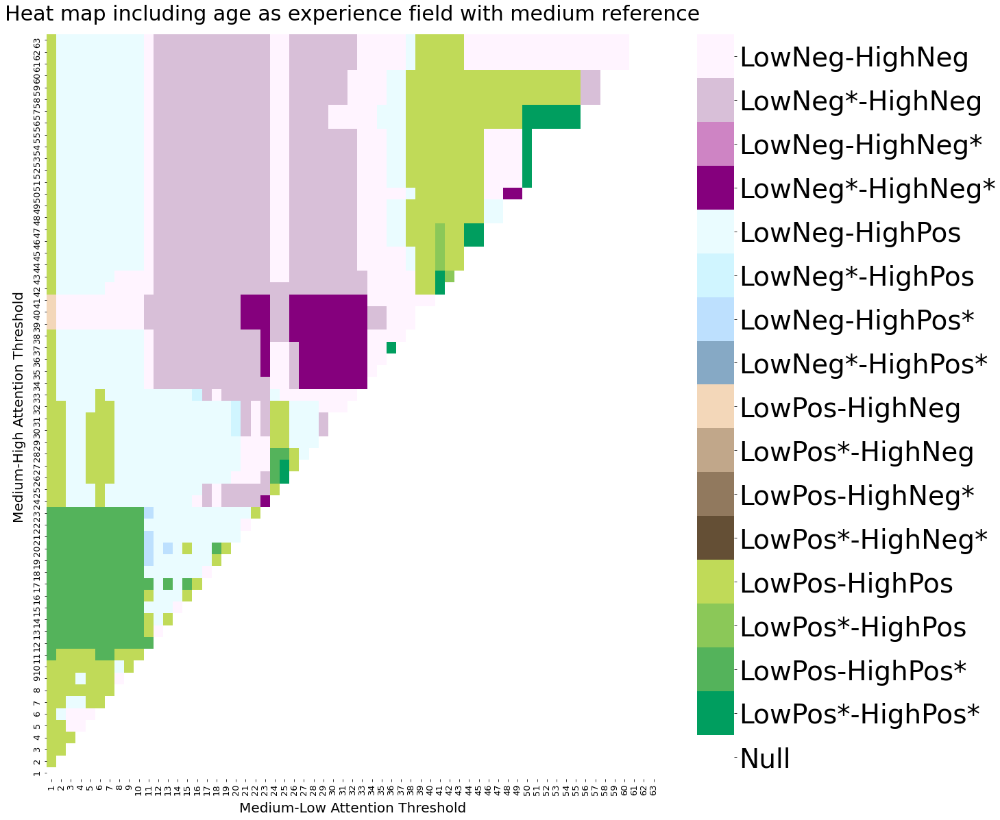

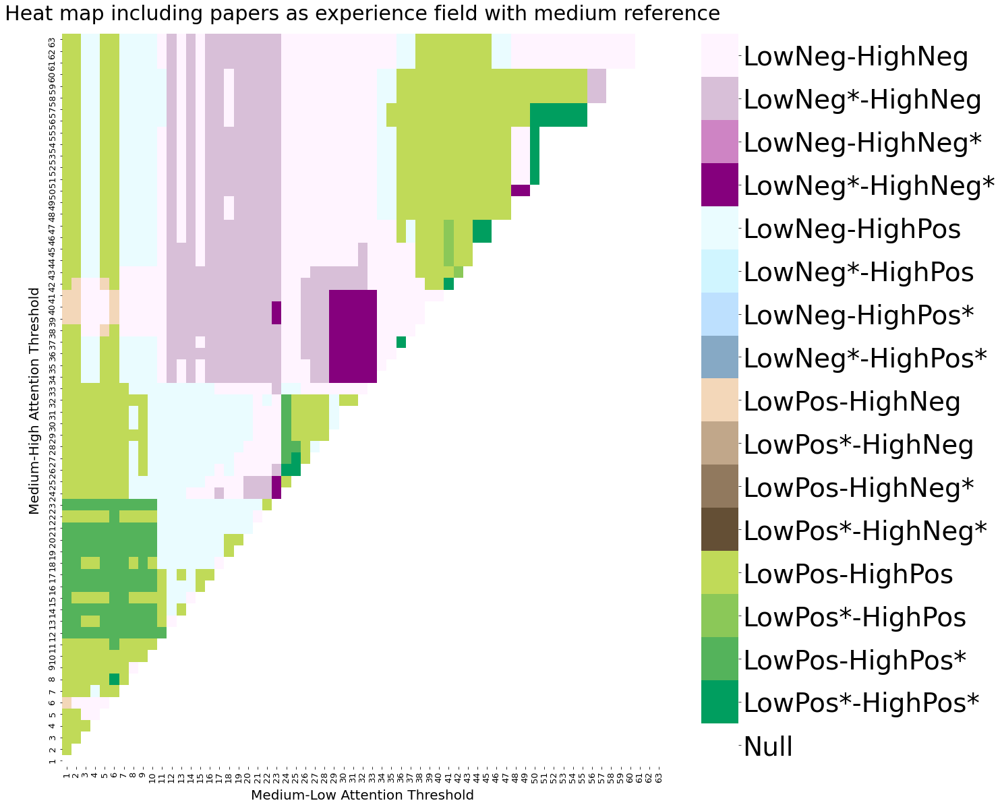

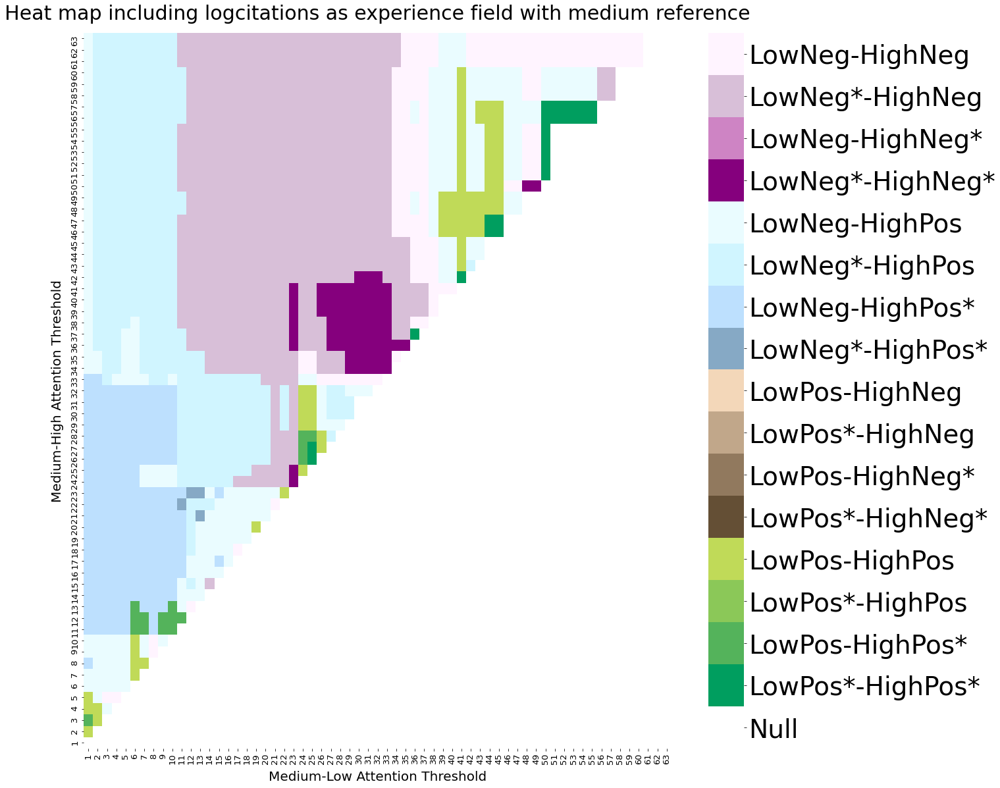

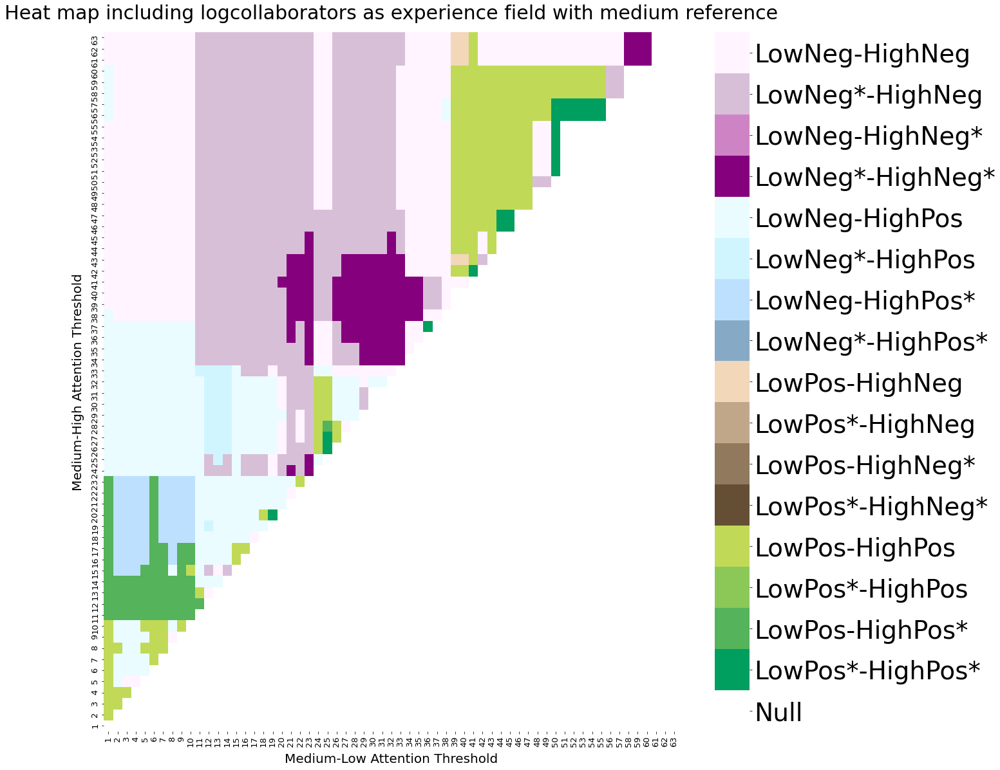

In [25]:
for experience_field in dict_tertiary_altmetric_mediumref.keys():
    
    title = "Heat map including " + experience_field + " as experience field with medium reference"
    
    threshold_dictionary = dict_tertiary_altmetric_mediumref.get(experience_field)
    
    df_threshold, cat_ord_color = prepare_data_2(threshold_dictionary,ub_altmetric)

    create_categorical_heatmap(df_threshold, tupLst_category_order_color=cat_ord_color, title=title,
                              tick_font_size=13)

In [26]:
# Importing relevant libraries

import pandas as pd
import math
from matplotlib.gridspec import GridSpec
import numpy as np

import pickle
import seaborn as sns
import matplotlib.pyplot as plt

# For colorbar
import matplotlib.colorbar as colorbar
import matplotlib.colors as clr

# For smoothing
from scipy.ndimage.filters import gaussian_filter

from collections import Counter

In [27]:
def prepare_data(threshold_dictionary, ub, reference_category='medium'):
    
    # This is the dictionary we prepare to create the dataframe for plot
    dict_for_df = {}
    
    # Going through each medium threshold
    for medium in range(1,ub):
        # Initializing the medium threshold list
        dict_for_df[medium] = []
        # Going through each high threshold
        for high in range(1,ub):
            # Let us get the value at this threshold
            paramsMediumOrLow,paramsHigh = threshold_dictionary.get((medium,high),(None,None))
            category = "Null" # This is category for when medium >= high
            
            if not pd.isnull(paramsMediumOrLow):
                # Expanding the tuples
                coefMediumOrLow, pvalMediumOrLow = paramsMediumOrLow
                coefHigh, pvalHigh = paramsHigh
                
                # Defining based on Coefficients
                mediumOrLowCategory = "LowPos" if coefMediumOrLow > 0 else "LowNeg"
                
                if reference_category=='low':
                    mediumOrLowCategory = "MedPos" if coefMediumOrLow > 0 else "MedNeg"
                
                highCategory = "HighPos" if coefHigh > 0 else "HighNeg"
                
                
                # Editing based on p-values
                mediumOrLowCategory = mediumOrLowCategory+"*" if pvalMediumOrLow <= 0.05 else mediumOrLowCategory
                highCategory = highCategory+"*" if pvalHigh <= 0.05 else highCategory
                
                
                category = mediumOrLowCategory + "-" + highCategory
                
                
            # Appending the category in order (order matters)
            dict_for_df[medium].append(category)
        
    cat_ord_color = [('Null',0,'#f5f5f5'),
                ('LowPos*-HighPos*',1,'#00472b'),('LowPos-HighPos*',2,'#54B35B'),
                ('LowPos*-HighPos',3,'#8BC858'),('LowPos-HighPos',4,'#C0DA58'),

                ('LowPos*-HighNeg*',5,'#644F35'),('LowPos-HighNeg*',6,'#91795E'),
                ('LowPos*-HighNeg',7,'#C1A78A'),('LowPos-HighNeg',8,'#F3D7B9'),

                ('LowNeg*-HighPos*',9,'#86A9C5'),('LowNeg-HighPos*',10,'#bde0fe'),
                ('LowNeg*-HighPos',11,'#D0F5FF'),('LowNeg-HighPos',12,'#EAFCFF'),

                ('LowNeg*-HighNeg*',13,'#85007D'),('LowNeg-HighNeg*',14,'#CE84C4'),
                ('LowNeg*-HighNeg',15,'#D8BFD8'),('LowNeg-HighNeg',16,'#FFF4FF')]
    
    return pd.DataFrame(dict_for_df, index=list(range(1,ub))), cat_ord_color

In [28]:
df_thresholds = []

experience_fields = list(dict_tertiary_altmetric_mediumref.keys())

for i in range(len(experience_fields)):
    
    experience_field = experience_fields[i]
    
    threshold_dictionary = dict_tertiary_altmetric_mediumref.get(experience_field)
    
    df_threshold, cat_ord_color = prepare_data(threshold_dictionary,ub_altmetric)
    
    df_thresholds.append(df_threshold)


df_threshold_intersection_3 = df_thresholds[0].copy()
df_threshold_intersection_4 = df_thresholds[0].copy()
categories_in_plot_3 = set()
categories_in_plot_4 = set()

for i in range(1,df_thresholds[0].shape[0]+1): #iterate over rows
    for j in range(1,df_thresholds[0].shape[1]+1): #iterate over columns

        value1 = df_thresholds[0].at[i, j]
        value2 = df_thresholds[1].at[i, j]
        value3 = df_thresholds[2].at[i, j]
        value4 = df_thresholds[3].at[i, j]
        
        most_occuring_val, highest_count = Counter([value1,value2,value3,value4]).most_common(1)[0]
        
        all4same = True if highest_count == 4 else False
        atleast3same = True if highest_count >= 3 else False
        
        if all4same and "*" in most_occuring_val:
            df_threshold_intersection_4.at[i,j] = most_occuring_val
            categories_in_plot_4.add(most_occuring_val)
        else:
            df_threshold_intersection_4.at[i,j] = "Null"
            categories_in_plot_4.add("Null")
            
            
        if atleast3same and "*" in most_occuring_val:
            df_threshold_intersection_3.at[i,j] = most_occuring_val
            categories_in_plot_3.add(most_occuring_val)
        else:
            df_threshold_intersection_3.at[i,j] = "Null"
            categories_in_plot_3.add("Null")

In [29]:
def create_categorical_heatmap(df, axesi, cpfromsns=None, 
                               tupLst_category_order_color=[], tick_font_size=40, title="",
                               spacing_of_tick_labels=2,
                               showcbar=False):
    
    """
    This function will take in the data frame, a tuple list mapping 
    each category to an order (1,2,3..,) and to color, and a tick_font_size 
    which is self-expl.
    """
    
    # converting each value to an integer for the heatmap
    value_to_int = {i:j for (i,j,k) in tupLst_category_order_color}
    
    #value_to_int = {j:i for i,j in enumerate(pd.unique(df.values.ravel()))}
    
    cmap = [color for (cat,order,color) in sorted(tupLst_category_order_color, key=lambda x: x[1])]

    # Extracting keys in order
    categories = [cat for (cat,order,color) in sorted(tupLst_category_order_color, key=lambda x: x[1])]
    #print(categories)
    
    # Checking the number of unique values we have for the legend
    n = len(value_to_int)
    
    # discrete colormap (n samples from a given cmap)
    if(cpfromsns):
        cmap = sns.color_palette(cpfromsns, n)
    
    # creating the heatmap
    ax = sns.heatmap(df.replace(value_to_int), 
                     ax=axesi,linewidths=0,
                     cmap=cmap, vmin=0,
                     vmax=len(tupLst_category_order_color),
                     xticklabels=spacing_of_tick_labels,
                     yticklabels=spacing_of_tick_labels,
                     cbar=showcbar) 
    
    # Invertint y-axis for better readability
    axesi.invert_yaxis()

In [30]:
def label_subplots(axi, labeli, xi=-0.1, yi=1.03):
    
    # Labeling the figure so that they can be referred in the paper
    axi.text(xi, yi, labeli, transform=axi.transAxes, fontfamily='DejaVu Sans',
      fontsize=200, fontweight='extra bold')

In [33]:
# Setting up the plot surface
fig = plt.figure(figsize=(160, 90))
gs = GridSpec(nrows=9, ncols=16)
#sns.set(font_scale=8)

# Zeroeth axes for dot plot for retention for full matched sample
ax0 = fig.add_subplot(gs[:4, :4])


# First axes for dot plot for gain for full matched sample
ax1 = fig.add_subplot(gs[4:8, :4], sharex=ax0)

# Second axes for bar plot showing author activity for full matched sample (attrition plot)
ax2 = fig.add_subplot(gs[:4, 4:8], sharey=ax0)


# Fourth axes for dot plot for retention for non-attrited authors
ax3 = fig.add_subplot(gs[4:8, 4:8], sharex=ax2, sharey=ax1)

# Fifth axes for dot plot for gain for non-attrited authors
ax4 = fig.add_subplot(gs[:8, 8:])

ax5 = fig.add_subplot(gs[8:, :])

axesLst = [ax0,ax1,ax2,ax3]

for i in range(len(experience_fields)):
    
    axesi = axesLst[i]
    
    title = "Heat map including " + experience_field + " as experience field with medium reference"
    
    df_threshold = df_thresholds[i]

    create_categorical_heatmap(df_threshold, axesi, tupLst_category_order_color=cat_ord_color, title=title,
                              spacing_of_tick_labels = 5)

            
title = "Heat map of the intersection of atleast 3 experience fields for significant values of attention"

create_categorical_heatmap(df_threshold_intersection_4, ax4, title=title,
                            tupLst_category_order_color=cat_ord_color)

ax0.tick_params(labelbottom=False, labeltop=True, labelsize=80, bottom=False, labelrotation=0)
ax0.tick_params(labelbottom=False, bottom=False, labelrotation=0)
ax1.tick_params(labelbottom=False, bottom=False, labelsize=80, labelrotation=0)
ax2.tick_params(labelbottom=False, bottom=False, left=False, labeltop=True, labelleft=False, labelsize=80, labelrotation=0)
ax3.tick_params(labelbottom=False, labelleft=False, bottom=False, left=False, labelsize=80, labelrotation=0)
ax4.tick_params(labelbottom=False, labeltop=True, bottom=False, labelsize=100, labelrotation=0)

fig.supylabel('Medium-High Threshold', fontsize=150, x=0.02, y=0.6)
fig.supxlabel('Low-Medium Threshold', fontsize=150, y=1.01)

# Now let us add the colorbar

format_dict = {
                0:['LowPos-HighPos','#C0DA58',r'$\beta_{low},\beta_{high}$'],
                1:['LowPos*-HighPos','#8BC858',r'$\beta_{low}^*,\beta_{high}$'],
                2:['LowPos-HighPos*','#54B35B',r'$\beta_{low},\beta_{high}^*$'],
                3:['LowPos*-HighPos*','#00472b',r'$\beta_{low}^*,\beta_{high}^*$'],
                4:['LowPos-HighNeg','#F3D7B9',r'$\beta_{low},-\beta_{high}$'],
                5:['LowPos*-HighNeg','#C1A78A',r'$\beta_{low}^*,-\beta_{high}$'],
                6:['LowPos-HighNeg*','#91795E',r'$\beta_{low},-\beta_{high}^*$'],
                7:['LowPos*-HighNeg*','#644F35',r'$\beta_{low}^*,-\beta_{high}^*$'],
                8:['LowNeg-HighPos','#EAFCFF',r'$-\beta_{low},\beta_{high}$'],
                9:['LowNeg*-HighPos','#D0F5FF',r'$-\beta_{low}^*,\beta_{high}$'],
                10:['LowNeg-HighPos*','#bde0fe',r'$-\beta_{low},\beta_{high}^*$'],
                11:['LowNeg*-HighPos*','#86A9C5',r'$-\beta_{low}^*,\beta_{high}^*$'],
                12:['LowNeg-HighNeg','#FFF4FF',r'$-\beta_{low},-\beta_{high}$'],
                13:['LowNeg*-HighNeg','#D8BFD8',r'$-\beta_{low}^*,-\beta_{high}$'],
                14:['LowNeg-HighNeg*','#CE84C4',r'$-\beta_{low},-\beta_{high}^*$'],
                15:['LowNeg*-HighNeg*','#85007D',r'$-\beta_{low}^*,-\beta_{high}^*$']
}

cb_colors = [color for (category,color,label) in format_dict.values()]
num_colors = len(cb_colors)
cmap_ = clr.ListedColormap(cb_colors)


cb = colorbar.ColorbarBase(ax5, orientation='horizontal',
                           cmap=cmap_, norm=plt.Normalize(-0.5, num_colors - 0.5))

cb.set_ticks(range(num_colors))

labels = [label for (category,color,label) in format_dict.values()]

cb.ax.set_xticklabels(labels, fontsize=80)

cb.outline.set_visible(False)


# Annotating figures
label_subplots(ax0, "a")
label_subplots(ax1, "c")
label_subplots(ax2, "b")
label_subplots(ax3, "d")
label_subplots(ax4, "e", xi=-0.07, yi=1.01)

ax5.annotate("Both low and high attention are in direct\n"\
             "    relationship with attrition w.r.t\n"\
             "               medium attention.",
            fontsize=100, xy=(0.09, 0.03), xycoords='figure fraction')

ax5.annotate("Low and high attention are respectively\n" 
             " in direct and inverse relationship with\n"
             "    attrition w.r.t medium attention",
            fontsize=100, xy=(0.32, 0.03), xycoords='figure fraction')

ax5.annotate("Low and high attention are respectively\n" 
             " in inverse and direct relationship with\n"
             "    attrition w.r.t medium attention",
            fontsize=100, xy=(0.55, 0.03), xycoords='figure fraction')

ax5.annotate("Both low and high attention are in inverse\n"\
             "    relationship with attrition w.r.t\n"\
             "               medium attention.",
            fontsize=100, xy=(0.76, 0.03), xycoords='figure fraction')

plt.tight_layout(pad=10)
#plt.savefig('heatmaps_ols_attrition_wSJR.svg',dpi=1200)
plt.savefig('heatmaps_ols_attrition_wSJR.pdf',format='pdf')
